## Install Packages

In [44]:
!pip install -q ultralytics roboflow

## Import Library

In [45]:
import os
import torch
from ultralytics import YOLO
from roboflow import Roboflow
from PIL import Image, ImageDraw
import glob
from google.colab import userdata
import random
from IPython.display import display
from cv2 import cvtColor, COLOR_BGR2RGB

## Verify GPU

In [46]:
# Verify GPU is available
def check_gpu():
    if torch.cuda.is_available():
        print(f"GPU is available. Using device: {torch.cuda.get_device_name(0)}")
        return True
    else:
        print("GPU is not available. Training will be much slower on CPU.")
        return False

is_gpu_available = check_gpu()

GPU is available. Using device: Tesla T4


## Data Preparation

API Setup

In [47]:
api_key = userdata.get('Roboflow_API_Key')
print(f"Type of API Key retrieved from userdata: {type(api_key)}")

Type of API Key retrieved from userdata: <class 'str'>


Fetch Data

In [48]:
rf = Roboflow(api_key=api_key) # Use the API key retrieved from userdata
project = rf.workspace("my-plan-pwm09").project("car-type-modelling")
dataset = project.version(5).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...


Looking for training images in: /content/Car-Type-Modelling-5/train/images
Displaying 6 random images from the training set in a 3x2 grid:


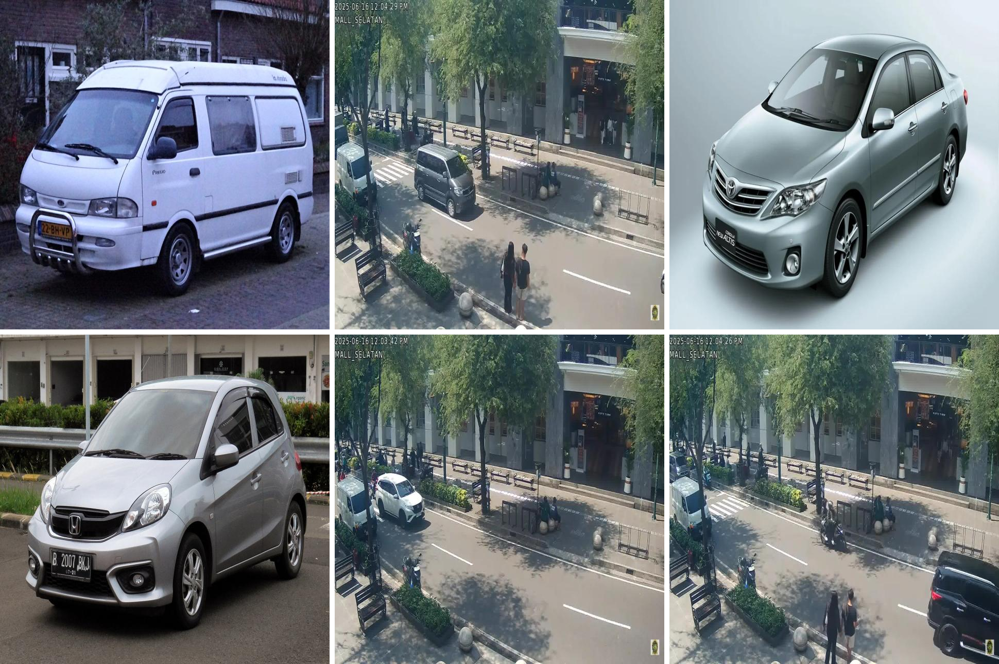

In [49]:
# Get the path to the training images
train_images_path = os.path.join(dataset.location, "train", "images")
print(f"Looking for training images in: {train_images_path}")

# Get a list of all image files in the training directory
train_image_files = glob.glob(os.path.join(train_images_path, '*.jpg'))

if train_image_files:
    # Select up to 6 random images for a 3x2 grid
    num_images_to_display = min(6, len(train_image_files))
    images_to_display = random.sample(train_image_files, num_images_to_display)

    print(f"Displaying {num_images_to_display} random images from the training set in a 3x2 grid:")

    if num_images_to_display > 0:
        # Determine image size (assuming all images are roughly the same size, take the first one)
        try:
            with Image.open(images_to_display[0]) as img:
                img_width, img_height = img.size
        except Exception as e:
            print(f"Could not open the first image to determine size: {e}")
            img_width, img_height = 100, 100 # Default size if unable to open

        # Define grid dimensions (3 columns, 2 rows)
        grid_cols = 3
        grid_rows = 2
        padding = 10 # Padding between images

        # Calculate dimensions for the combined grid image
        grid_width = grid_cols * img_width + (grid_cols - 1) * padding
        grid_height = grid_rows * img_height + (grid_rows - 1) * padding

        # Create a new blank image for the grid
        grid_image = Image.new('RGB', (grid_width, grid_height), color = (255, 255, 255)) # White background

        # Paste images onto the grid
        for i, image_path in enumerate(images_to_display):
            try:
                with Image.open(image_path) as img:
                    # Calculate position for the current image in the grid
                    row = i // grid_cols
                    col = i % grid_cols
                    x_offset = col * (img_width + padding)
                    y_offset = row * (img_height + padding)

                    # Ensure the image size matches the calculated size or resize it
                    if img.size != (img_width, img_height):
                        img = img.resize((img_width, img_height))

                    grid_image.paste(img, (x_offset, y_offset))
            except Exception as e:
                print(f"Could not process image {image_path} for grid display: {e}")

        # Display the final grid image
        display(grid_image)
    else:
        print("No images selected to display.")

else:
    print(f"No training images found in {train_images_path}")

Looking for testing images in: /content/Car-Type-Modelling-5/test/images
Displaying 6 random images from the testing set in a 3x2 grid:


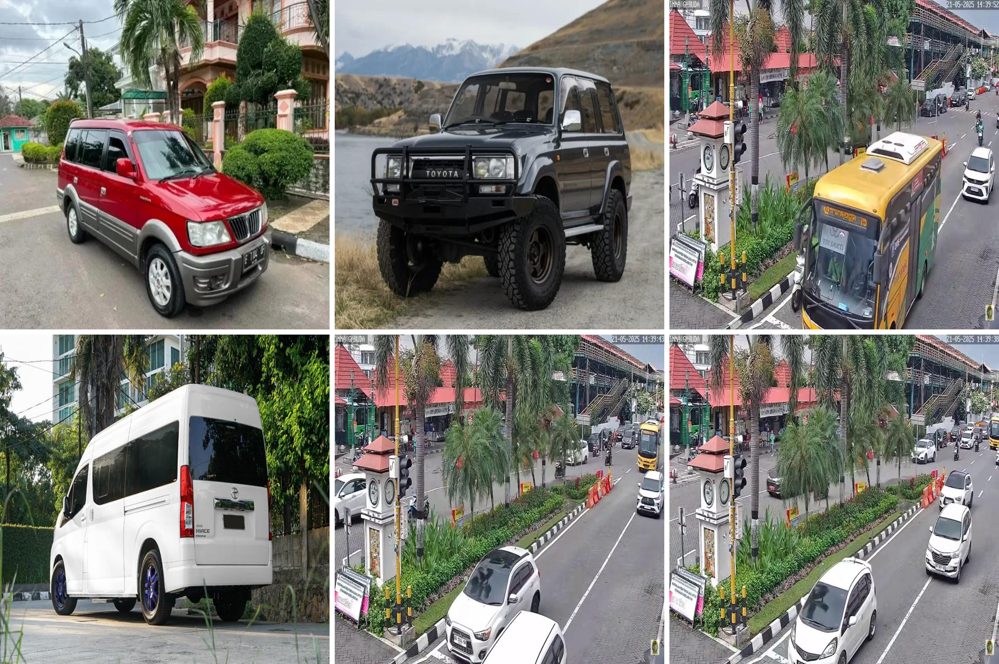

In [50]:
# Get the path to the testing images
test_images_path = os.path.join(dataset.location, "test", "images")
print(f"Looking for testing images in: {test_images_path}")

# Get a list of all image files in the testing directory
test_image_files = glob.glob(os.path.join(test_images_path, '*.jpg'))

if test_image_files:
    # Select up to 6 random images for a 3x2 grid
    num_images_to_display = min(6, len(test_image_files))
    images_to_display = random.sample(test_image_files, num_images_to_display)

    print(f"Displaying {num_images_to_display} random images from the testing set in a 3x2 grid:")

    if num_images_to_display > 0:
        # Determine image size (assuming all images are roughly the same size, take the first one)
        try:
            with Image.open(images_to_display[0]) as img:
                img_width, img_height = img.size
        except Exception as e:
            print(f"Could not open the first image to determine size: {e}")
            img_width, img_height = 100, 100 # Default size if unable to open

        # Define grid dimensions (3 columns, 2 rows)
        grid_cols = 3
        grid_rows = 2
        padding = 10 # Padding between images

        # Calculate dimensions for the combined grid image
        grid_width = grid_cols * img_width + (grid_cols - 1) * padding
        grid_height = grid_rows * img_height + (grid_rows - 1) * padding

        # Create a new blank image for the grid
        grid_image = Image.new('RGB', (grid_width, grid_height), color = (255, 255, 255)) # White background

        # Paste images onto the grid
        for i, image_path in enumerate(images_to_display):
            try:
                with Image.open(image_path) as img:
                    # Calculate position for the current image in the grid
                    row = i // grid_cols
                    col = i % grid_cols
                    x_offset = col * (img_width + padding)
                    y_offset = row * (img_height + padding)

                    # Ensure the image size matches the calculated size or resize it
                    if img.size != (img_width, img_height):
                        img = img.resize((img_width, img_height))

                    grid_image.paste(img, (x_offset, y_offset))
            except Exception as e:
                print(f"Could not process image {image_path} for grid display: {e}")

        # Display the final grid image
        display(grid_image)
    else:
        print("No images selected to display.")

else:
    print(f"No testing images found in {test_images_path}")

Save Data

In [51]:
data_yaml_path = os.path.join(dataset.location, "data.yaml")
print(f"Dataset downloaded to: {dataset.location}")
print(f"Data configuration file path: {data_yaml_path}")

Dataset downloaded to: /content/Car-Type-Modelling-5
Data configuration file path: /content/Car-Type-Modelling-5/data.yaml


## Model Fine-Tuning

In [53]:
# Load a pre-trained YOLOv11 nano model
model = YOLO('yolo11n.pt')

# Train the model on our custom dataset
results = model.train(
    data=data_yaml_path,
    epochs=50,
    imgsz=640,
    project='custom_yolo_training',
    name='car_type_finetune'
)
print("Training complete.")

Ultralytics 8.3.170 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Car-Type-Modelling-5/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=car_type_finetune3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=Tru

train: Scanning /content/Car-Type-Modelling-5/train/labels.cache... 589 images, 6 backgrounds, 0 corrupt: 100%|██████████| 589/589 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 484.9±118.0 MB/s, size: 76.1 KB)


val: Scanning /content/Car-Type-Modelling-5/valid/labels.cache... 131 images, 0 backgrounds, 0 corrupt: 100%|██████████| 131/131 [00:00<?, ?it/s]


Plotting labels to custom_yolo_training/car_type_finetune3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to custom_yolo_training/car_type_finetune3
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25      2.55G      0.637      3.175      1.169         42        640: 100%|██████████| 37/37 [00:12<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.69it/s]

                   all        131        141     0.0128          1      0.182      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      2.82G     0.6833      2.571       1.18         36        640: 100%|██████████| 37/37 [00:11<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]

                   all        131        141      0.188      0.526      0.226      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25      2.82G     0.6745       2.24      1.164         33        640: 100%|██████████| 37/37 [00:10<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.42it/s]

                   all        131        141      0.227      0.646      0.269      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25      2.82G     0.6905      2.044      1.157         43        640: 100%|██████████| 37/37 [00:10<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.44it/s]

                   all        131        141      0.249      0.402      0.325      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25      2.82G     0.6549      1.956      1.141         41        640: 100%|██████████| 37/37 [00:10<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.17it/s]

                   all        131        141       0.33      0.584      0.467      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25      2.82G     0.6323      1.826      1.116         30        640: 100%|██████████| 37/37 [00:13<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.78it/s]

                   all        131        141      0.337      0.452      0.354      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25      2.82G      0.627       1.76      1.133         37        640: 100%|██████████| 37/37 [00:11<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.51it/s]

                   all        131        141      0.345      0.565      0.465      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25      2.82G     0.5773      1.608      1.085         32        640: 100%|██████████| 37/37 [00:10<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.45it/s]

                   all        131        141      0.494      0.495      0.537      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25      2.82G     0.6109      1.539      1.089         36        640: 100%|██████████| 37/37 [00:11<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.85it/s]

                   all        131        141      0.408      0.686        0.6      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25      2.82G     0.5889      1.461      1.083         52        640: 100%|██████████| 37/37 [00:10<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.18it/s]

                   all        131        141      0.495      0.709      0.574      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      2.82G     0.5379       1.45      1.078         42        640: 100%|██████████| 37/37 [00:10<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.36it/s]

                   all        131        141      0.525      0.737      0.674      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25      2.82G     0.5456      1.353      1.054         43        640: 100%|██████████| 37/37 [00:10<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.46it/s]

                   all        131        141      0.705      0.641      0.699      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25      2.82G     0.5345      1.343      1.073         35        640: 100%|██████████| 37/37 [00:10<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.20it/s]

                   all        131        141      0.539      0.744      0.722      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25      2.82G     0.5174       1.29      1.065         42        640: 100%|██████████| 37/37 [00:10<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.25it/s]

                   all        131        141      0.615      0.603      0.659      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25      2.82G     0.5102      1.262      1.059         39        640: 100%|██████████| 37/37 [00:10<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.70it/s]

                   all        131        141       0.54      0.802      0.746      0.702


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      2.82G     0.4025      1.206     0.9633         17        640: 100%|██████████| 37/37 [00:12<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.69it/s]

                   all        131        141       0.68      0.785      0.778      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25      2.82G     0.4024      1.094     0.9662         13        640: 100%|██████████| 37/37 [00:10<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.74it/s]

                   all        131        141      0.799      0.702      0.842      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25      2.82G     0.3914       1.04     0.9552         14        640: 100%|██████████| 37/37 [00:09<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.58it/s]

                   all        131        141      0.742      0.721      0.775      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25      2.82G     0.3807     0.9454     0.9339         18        640: 100%|██████████| 37/37 [00:09<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.17it/s]


                   all        131        141      0.562      0.751      0.741      0.701

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25      2.82G     0.3732      0.942     0.9279         13        640: 100%|██████████| 37/37 [00:09<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.87it/s]

                   all        131        141      0.689      0.832      0.872      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25      2.82G     0.3666     0.8558     0.9179         21        640: 100%|██████████| 37/37 [00:10<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.06it/s]

                   all        131        141      0.702      0.746      0.793      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25      2.82G     0.3472     0.8325     0.9257         17        640: 100%|██████████| 37/37 [00:10<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.78it/s]

                   all        131        141      0.761      0.758      0.844       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25      2.82G     0.3382     0.7622     0.8979         19        640: 100%|██████████| 37/37 [00:10<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.88it/s]

                   all        131        141      0.831      0.772      0.874      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25      2.82G     0.3352     0.7433     0.9125         13        640: 100%|██████████| 37/37 [00:10<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.90it/s]

                   all        131        141      0.751      0.831      0.894      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      2.82G     0.3271     0.7211     0.9023         17        640: 100%|██████████| 37/37 [00:10<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.01it/s]

                   all        131        141      0.847      0.828      0.918      0.895



25 epochs completed in 0.088 hours.
Optimizer stripped from custom_yolo_training/car_type_finetune3/weights/last.pt, 5.5MB
Optimizer stripped from custom_yolo_training/car_type_finetune3/weights/best.pt, 5.5MB

Validating custom_yolo_training/car_type_finetune3/weights/best.pt...
Ultralytics 8.3.170 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,322 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.87it/s]


                   all        131        141      0.847      0.827      0.918      0.895
             Hatchback         22         24       0.87      0.837      0.917      0.898
                   MPV         39         41      0.839      0.854      0.907      0.844
               Minibus         18         18       0.89          1      0.984      0.955
                Pickup         19         23      0.866      0.846      0.949      0.932
                   SUV         14         15      0.845      0.726       0.87       0.87
                 Sedan         19         20      0.771        0.7      0.884      0.872
Speed: 0.2ms preprocess, 2.6ms inference, 0.0ms loss, 6.2ms postprocess per image
Results saved to custom_yolo_training/car_type_finetune3
Training complete.


## Model Evaluation

In [56]:
# The path to the best model weights saved during training
best_model_path = os.path.join('custom_yolo_training', 'car_type_finetune', 'weights', 'best.pt')

if os.path.exists(best_model_path):
    # Load our custom-trained model
    model = YOLO(best_model_path)

    # Run validation on the test set
    print("Evaluating model performance on the test set...")
    metrics = model.val(split='test')

    # The metrics object contains performance data like mAP50-95
    print("\nEvaluation Metrics:")
    print(f"mAP50-95: {metrics.box.map:.4f}") # Main metric: mean Average Precision
    print(f"mAP50: {metrics.box.map50:.4f}")   # Metric at 50% IoU threshold
    print(f"mAP75: {metrics.box.map75:.4f}")   # Metric at 75% IoU threshold
else:
    print(f"Error: Could not find the trained model at {best_model_path}")
    # As a fallback, we will continue with the base model for inference
    model = YOLO('yolo11n.pt')

Evaluating model performance on the test set...
Ultralytics 8.3.170 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1499.0±462.7 MB/s, size: 54.8 KB)


val: Scanning /content/Car-Type-Modelling-2/test/labels.cache... 11 images, 1 backgrounds, 0 corrupt: 100%|██████████| 11/11 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.35it/s]


                   all         11         11      0.911          1      0.927      0.894
Speed: 0.3ms preprocess, 7.1ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to runs/detect/val4

Evaluation Metrics:
mAP50-95: 0.8941
mAP50: 0.9275
mAP75: 0.9275


## Model Testing

Looking for testing images in: /content/Car-Type-Modelling-5/test/images
Running inference on 6 random test images and displaying in a 3x2 grid...

Displaying inference results in a 3x2 grid:


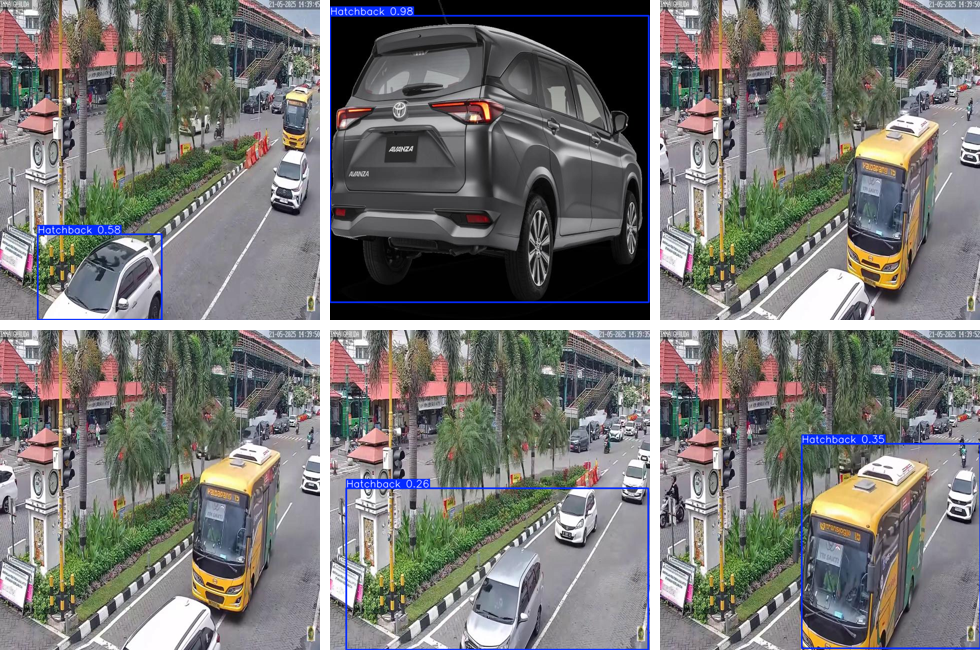

In [59]:
# Get a list of images from the test set
test_images_path = os.path.join(dataset.location, "test", "images")
print(f"Looking for testing images in: {test_images_path}")
test_image_files = glob.glob(os.path.join(test_images_path, '*.jpg'))

if test_image_files:
    # Select up to 6 random images for inference and 3x2 grid display
    num_images_to_test = min(6, len(test_image_files))
    images_to_test = random.sample(test_image_files, num_images_to_test)
    print(f"Running inference on {len(images_to_test)} random test images and displaying in a 3x2 grid...")

    # Run prediction
    results = model.predict(source=images_to_test, verbose=False) # Set verbose=False to reduce output during inference

    if results:
        # Determine image size for the grid (use a smaller size)
        small_img_width = 320 # Desired width for smaller images
        small_img_height = 320 # Desired height for smaller images (adjust aspect ratio as needed)

        # Define grid dimensions (3 columns, 2 rows)
        grid_cols = 3
        grid_rows = 2
        padding = 10 # Padding between images

        # Calculate dimensions for the combined grid image
        grid_width = grid_cols * small_img_width + (grid_cols - 1) * padding
        grid_height = grid_rows * small_img_height + (grid_rows - 1) * padding

        # Create a new blank image for the grid
        grid_image = Image.new('RGB', (grid_width, grid_height), color = (255, 255, 255)) # White background

        # Process results and paste onto the grid
        for i, result in enumerate(results):
            if i >= grid_cols * grid_rows: # Only process up to 6 results for the 3x2 grid
                break

            result_image_array = result.plot() # Get image with boxes drawn

            # Convert BGR to RGB
            result_image_rgb = cvtColor(result_image_array, COLOR_BGR2RGB)

            # Convert numpy array to PIL Image and resize
            pil_img = Image.fromarray(result_image_rgb)
            pil_img_resized = pil_img.resize((small_img_width, small_img_height))


            # Calculate position for the current image in the grid
            row = i // grid_cols
            col = i % grid_cols
            x_offset = col * (small_img_width + padding)
            y_offset = row * (small_img_height + padding)

            # Paste the resized image onto the grid
            grid_image.paste(pil_img_resized, (x_offset, y_offset))

        # Display the final grid image
        print("\nDisplaying inference results in a 3x2 grid:")
        display(grid_image)
    else:
        print("No inference results obtained.")

else:
    print(f"No test images found in {test_images_path}")